In [1]:
import pickle
from helper_fxns import convert_param_vec_dict_to_param_dict, gelman_rubin_trace_dict, print_convergence_summary, sample_plots, create_trace_matrix, plot_histograms
from earm.lopez_embedded import model
%matplotlib inline
import os
import numpy as np
from corner import corner
import matplotlib.pyplot as plt
import seaborn as sns

/Users/Erin/Library/Python/2.7/lib/python/site-packages/IPython/html.py:14: ShimWarning: The `IPython.html` package has been deprecated. You should import from `notebook` instead. `IPython.html.widgets` has moved to `ipywidgets`.
  "`IPython.html.widgets` has moved to `ipywidgets`.", ShimWarning)
/Users/Erin/Library/Python/2.7/lib/python/site-packages/IPython/utils/traitlets.py:5: UserWarning: IPython.utils.traitlets has moved to a top-level traitlets package.
  warn("IPython.utils.traitlets has moved to a top-level traitlets package.")


In [2]:
os.chdir('/Users/Erin/git/accre_data_analysis/uniform_priors_.25his_88params/')

In [3]:
traces = {}
for trace in ['a', 'b', 'c', 'd']:
    traces[trace] = [np.load('earm_dreamzs_5chain_uniform_.25his_'+str(trace)+'_sampled_params_chain_0.npy')]
    for chain in range(1, 5):
        traces[trace].append(np.load('earm_dreamzs_5chain_uniform_.25his_'+str(trace)+'_sampled_params_chain_'+str(chain)+'.npy'))

In [4]:
logps = {}
for trace in ['a', 'b', 'c', 'd']:
    logps[trace] = [np.load('earm_dreamzs_5chain_uniform_.25his_'+str(trace)+'_logps_chain_0.npy')]
    print 'Logp of trace: ',trace,' chain: 0 = ',logps[trace][-1]
    for chain in range(1, 5):
        logps[trace].append(np.load('earm_dreamzs_5chain_uniform_.25his_'+str(trace)+'_logps_chain_'+str(chain)+'.npy'))
        print 'Logp of trace: ',trace,' chain: ',chain,' = ',logps[trace][-1][-1]

Logp of trace:  a  chain: 0 =  [[-3718.58048041]
 [-3718.58048041]
 [-3718.58048041]
 ..., 
 [  151.23775761]
 [  151.23775761]
 [  151.23775761]]
Logp of trace:  a  chain:  1  =  [ 148.3438183]
Logp of trace:  a  chain:  2  =  [ 148.86659835]
Logp of trace:  a  chain:  3  =  [ 151.07560848]
Logp of trace:  a  chain:  4  =  [ 149.79500307]
Logp of trace:  b  chain: 0 =  [[-1800.47526037]
 [-1772.79954885]
 [-1772.79954885]
 ..., 
 [  147.60271801]
 [  147.60271801]
 [  147.60271801]]
Logp of trace:  b  chain:  1  =  [ 154.86690682]
Logp of trace:  b  chain:  2  =  [ 150.27019829]
Logp of trace:  b  chain:  3  =  [ 149.10847951]
Logp of trace:  b  chain:  4  =  [ 151.96889058]
Logp of trace:  c  chain: 0 =  [[-1665.45090116]
 [-1665.45090116]
 [-1665.45090116]
 ..., 
 [  150.23128254]
 [  150.23128254]
 [  150.23128254]]
Logp of trace:  c  chain:  1  =  [ 151.45017529]
Logp of trace:  c  chain:  2  =  [ 150.25620843]
Logp of trace:  c  chain:  3  =  [ 154.09734357]
Logp of trace:  c  ch

In [5]:
traces['a'][0][:,72]

array([-1.26415806, -1.26415806, -1.26415806, ..., -1.48198873,
       -1.48198873, -1.48198873])

In [6]:
param_trace_dicts = {}
param_trace_dict_a = {}
gelman_rubin_dicts = {}
param_trace_dict_a['param_list'] = [param.name for param in model.parameters_rules()]
for run in ['a', 'b', 'c', 'd']:
    for i, param in enumerate(model.parameters_rules()):
        param_trace_dict_a[param.name] = [traces[run][chain][:,i] for chain in range(len(traces[run]))]
    param_trace_dicts[run] = param_trace_dict_a
    gelman_rubin_dicts[run] = gelman_rubin_trace_dict(param_trace_dict_a)
    param_trace_dict_a = {}
    param_trace_dict_a['param_list'] = [param.name for param in model.parameters_rules()]

In [7]:
print_convergence_summary(param_trace_dicts['a'])

Number of parameters with GR below 1.2:  50  of  88  parameters.
Percent of parameters with GR below 1.2:  56.8181818182
Number of parameters with GR below 1.1:  22  of  88  parameters.
Percent of parameters with GR below 1.1:  25.0


[50, 56.81818181818182, 22, 25.0]

In [8]:
print_convergence_summary(param_trace_dicts['b'])

Number of parameters with GR below 1.2:  32  of  88  parameters.
Percent of parameters with GR below 1.2:  36.3636363636
Number of parameters with GR below 1.1:  8  of  88  parameters.
Percent of parameters with GR below 1.1:  9.09090909091


[32, 36.36363636363637, 8, 9.090909090909092]

In [9]:
print_convergence_summary(param_trace_dicts['c'])

Number of parameters with GR below 1.2:  45  of  88  parameters.
Percent of parameters with GR below 1.2:  51.1363636364
Number of parameters with GR below 1.1:  17  of  88  parameters.
Percent of parameters with GR below 1.1:  19.3181818182


[45, 51.13636363636363, 17, 19.318181818181817]

In [10]:
print_convergence_summary(param_trace_dicts['d'])

Number of parameters with GR below 1.2:  63  of  88  parameters.
Percent of parameters with GR below 1.2:  71.5909090909
Number of parameters with GR below 1.1:  29  of  88  parameters.
Percent of parameters with GR below 1.1:  32.9545454545


[63, 71.5909090909091, 29, 32.95454545454545]

50000
5
50000


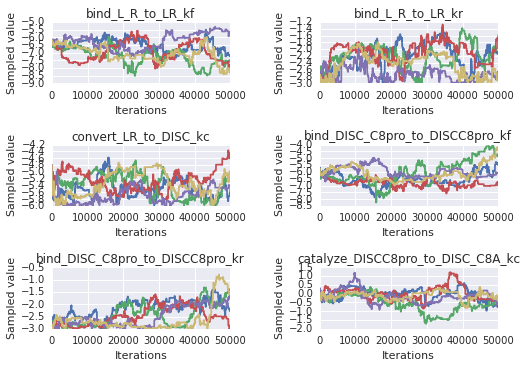

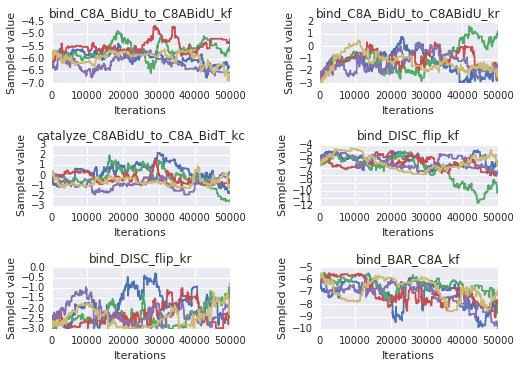

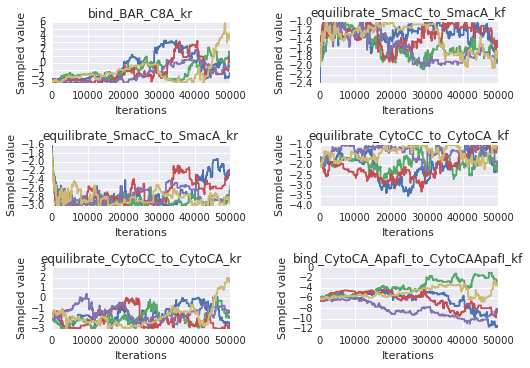

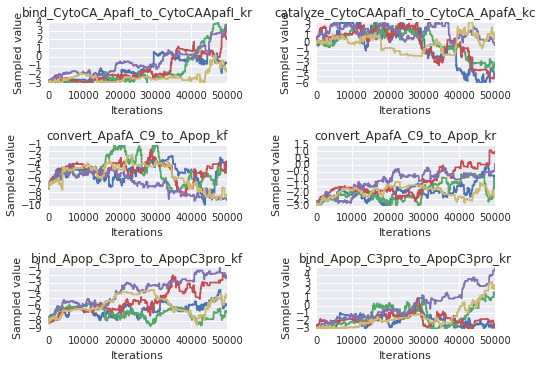

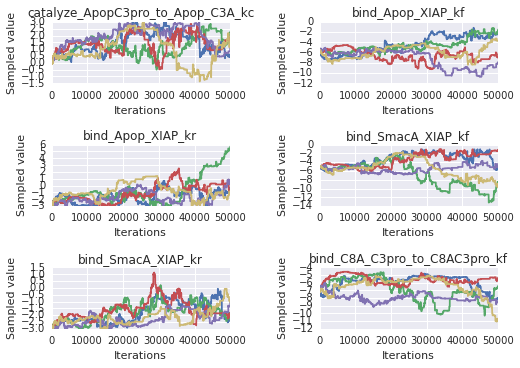

...

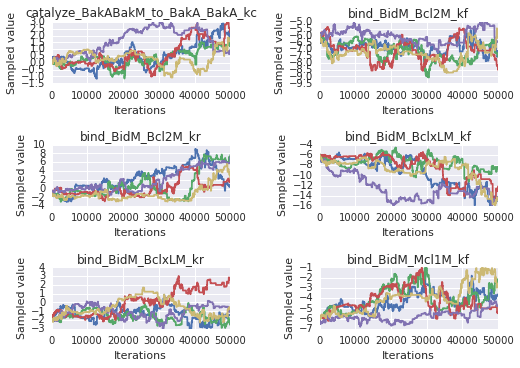

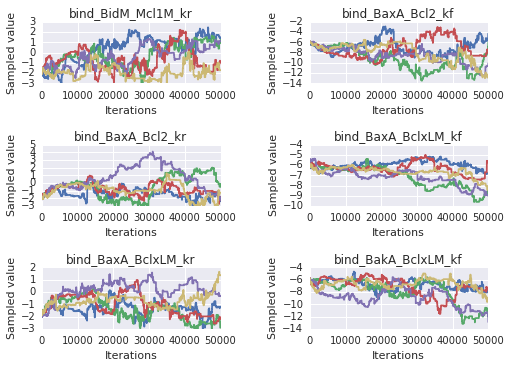

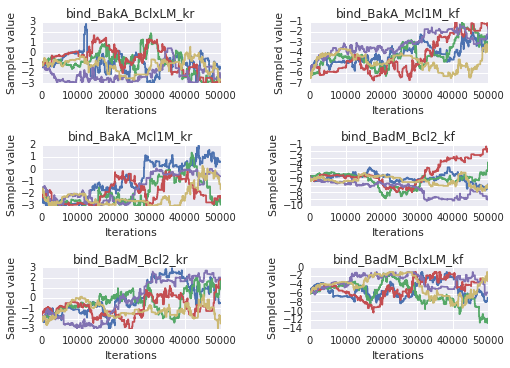

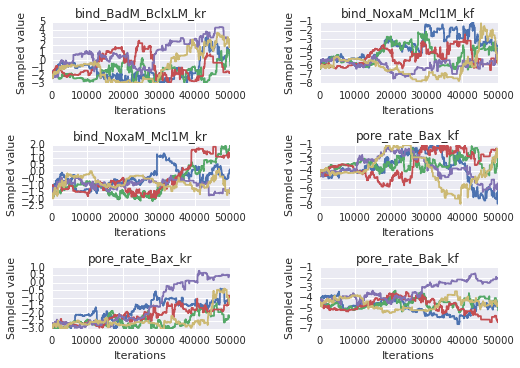

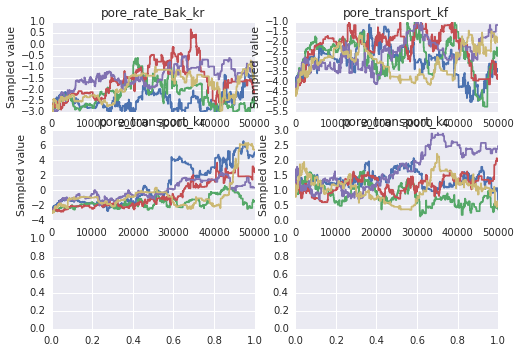

In [11]:
sample_plots(param_trace_dicts['a'])

In [12]:
trace_arr_a = create_trace_matrix(param_trace_dicts['a'], burnin=40000, thin=1)
trace_arr_b = create_trace_matrix(param_trace_dicts['b'], burnin=40000, thin=1)
trace_arr_c = create_trace_matrix(param_trace_dicts['c'], burnin=40000, thin=1)
trace_arr_d = create_trace_matrix(param_trace_dicts['d'], burnin=40000, thin=1)

/System/Library/Frameworks/Python.framework/Versions/2.7/Extras/lib/python/matplotlib/pyplot.py:412: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_num_figures`).
  max_open_warning, RuntimeWarning)


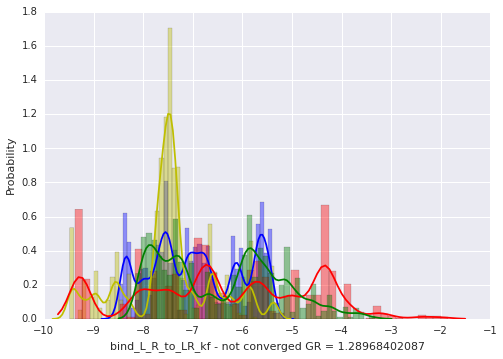

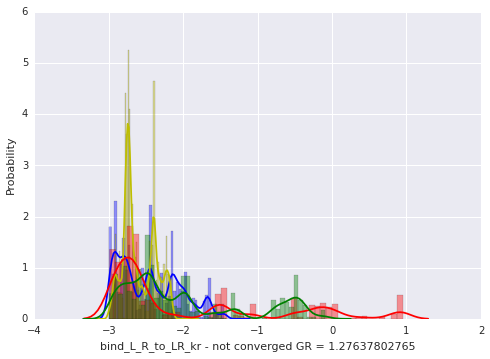

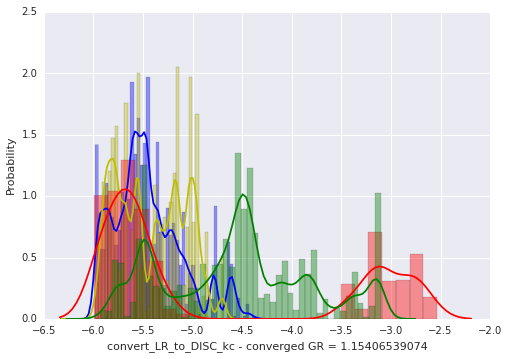

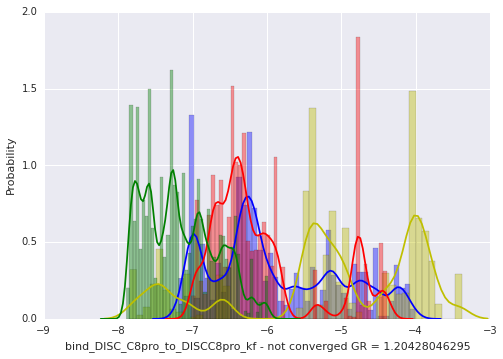

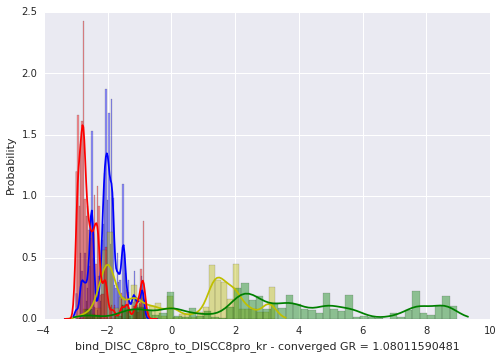

...

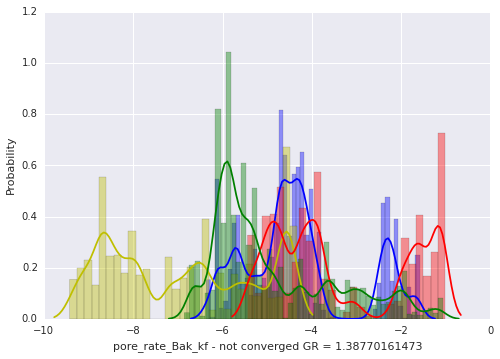

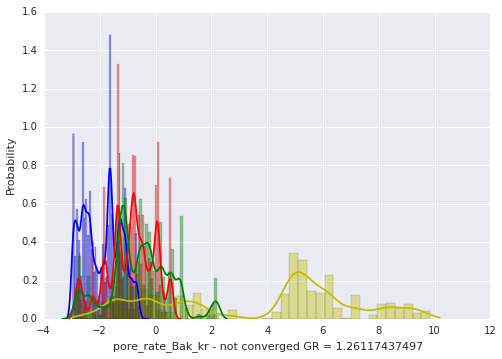

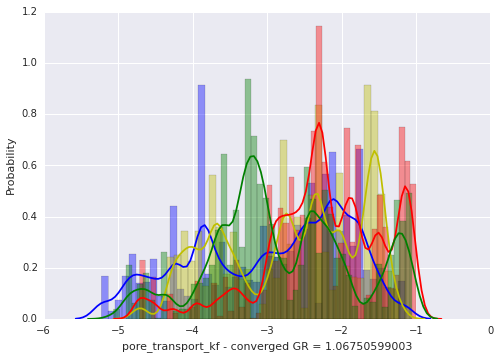

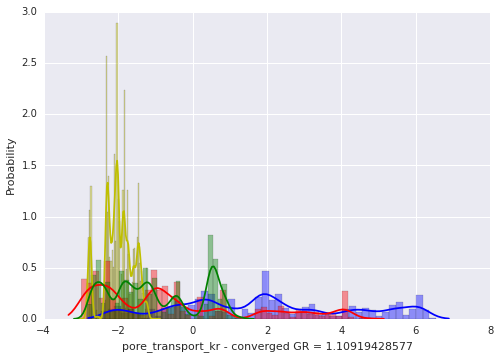

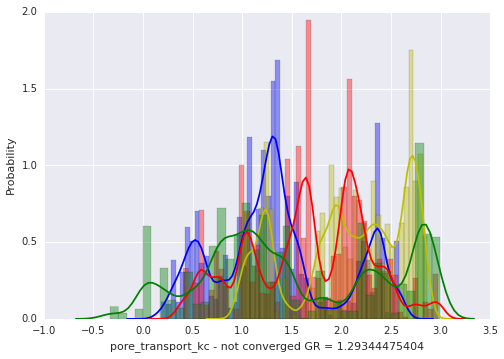

In [13]:
for dim, param_name in enumerate([param.name for param in model.parameters_rules()]):
    fig = plt.figure()
    sns.plotting_context('notebook')
    ax = sns.distplot(trace_arr_a[:,dim], hist=True, color='b')
    sns.distplot(trace_arr_b[:,dim], hist=True, color='y')
    sns.distplot(trace_arr_c[:,dim], hist=True, color='r')
    sns.distplot(trace_arr_d[:,dim], hist=True, color='g')
    if gelman_rubin_dicts['a'][param_name] < 1.2:
        sns.axlabel(param_name+' - converged GR = '+str(gelman_rubin_dicts['a'][param_name]), 'Probability')
    else:
        sns.axlabel(param_name+' - not converged GR = '+str(gelman_rubin_dicts['a'][param_name]), 'Probability')

In [14]:
traces['a'][1][:,0]

array([-6.31836669, -6.31836669, -6.31836669, ..., -7.60933302,
       -7.60933302, -7.60933302])

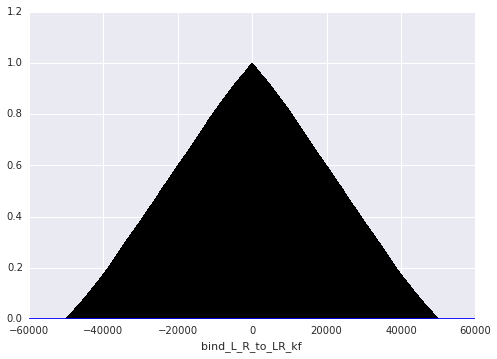

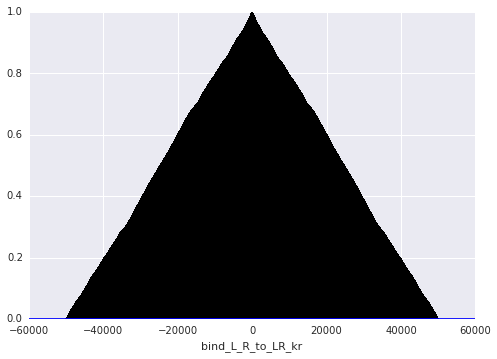

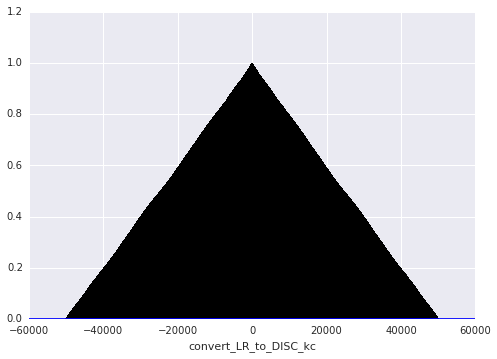

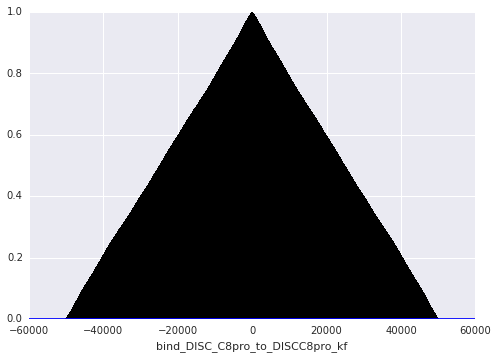

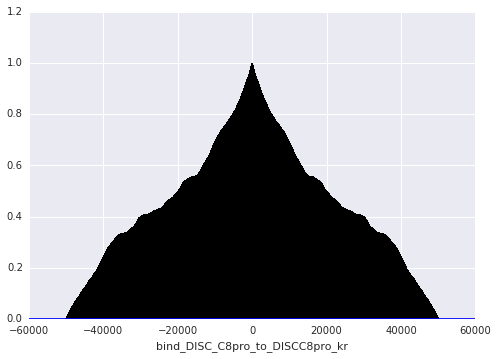

...

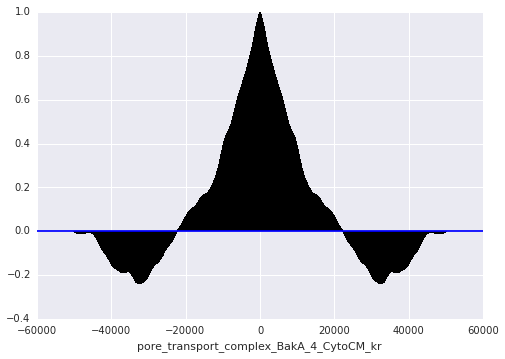

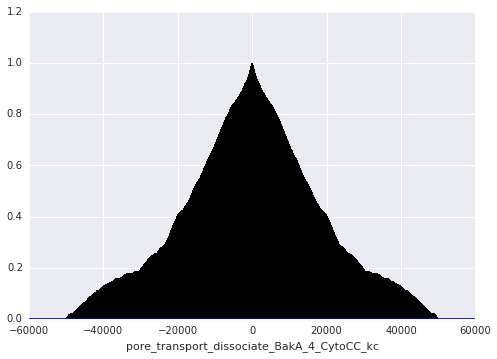

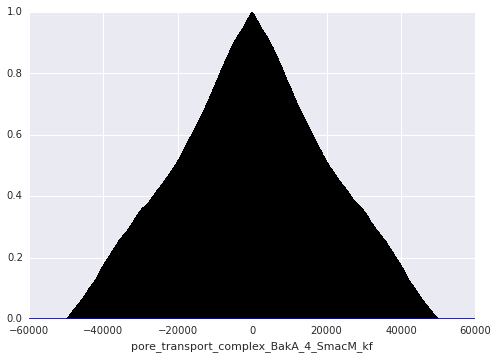

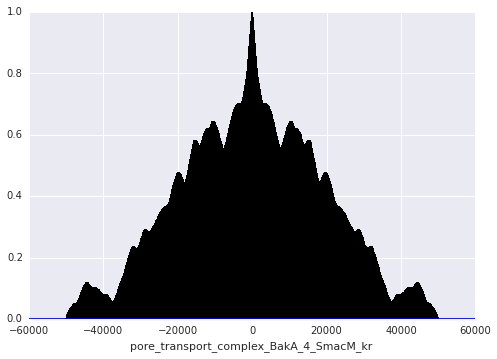

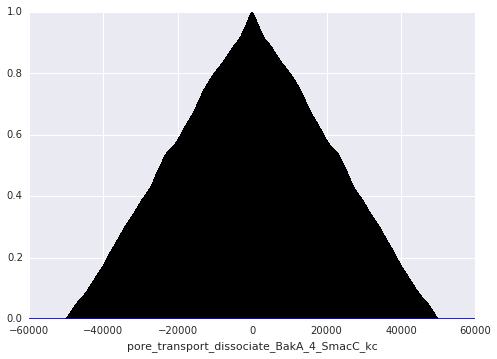

In [21]:
for dim, param_name in enumerate([param.name for param in model.parameters_rules()]):
    fig = plt.figure()
    plt.acorr(traces['a'][0][:,dim], maxlags=None)
    plt.xlabel(str(param_name))

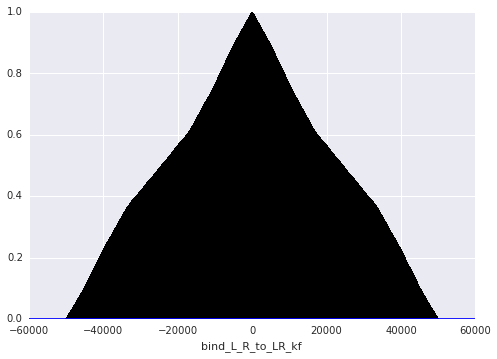

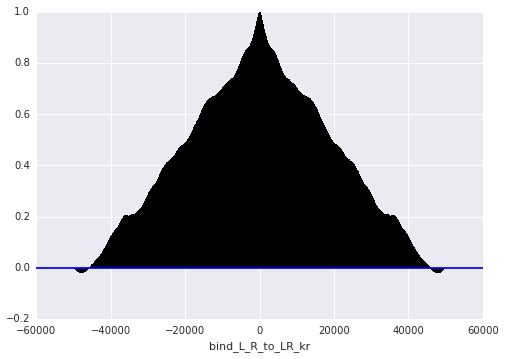

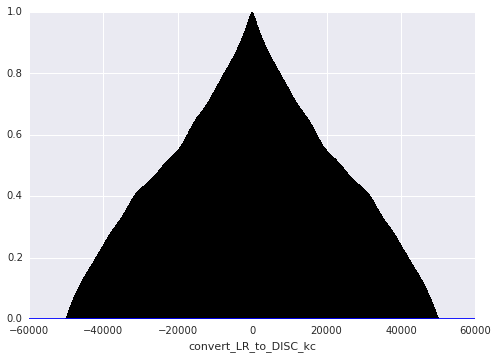

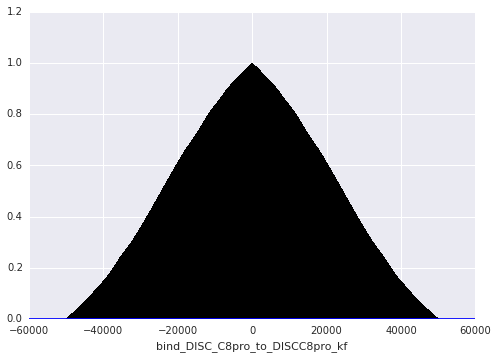

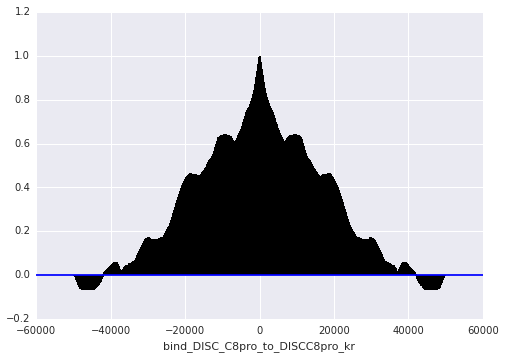

...

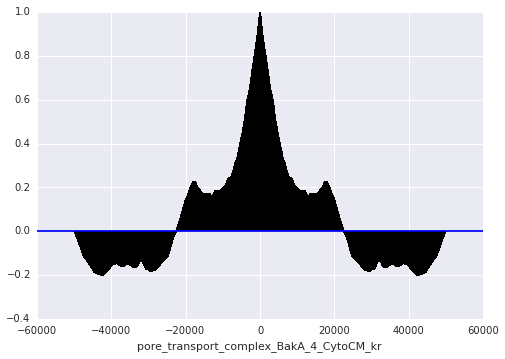

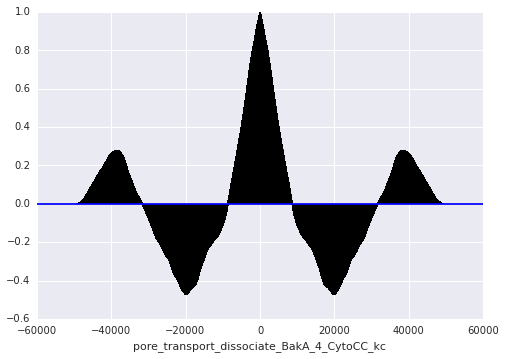

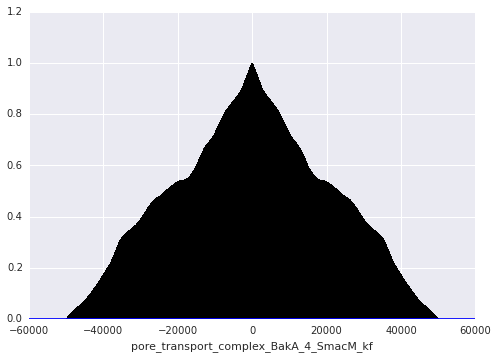

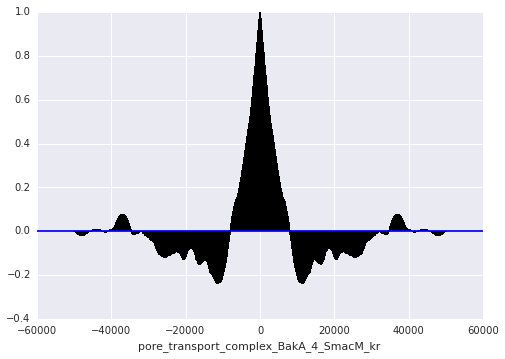

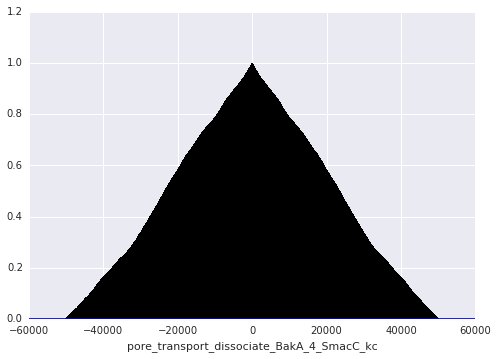

In [22]:
for dim, param_name in enumerate([param.name for param in model.parameters_rules()]):
    fig = plt.figure()
    plt.acorr(traces['a'][1][:,dim], maxlags=None)
    plt.xlabel(str(param_name))

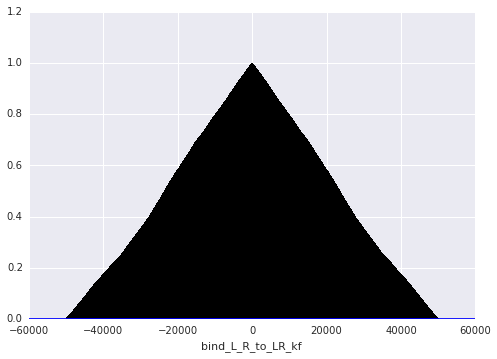

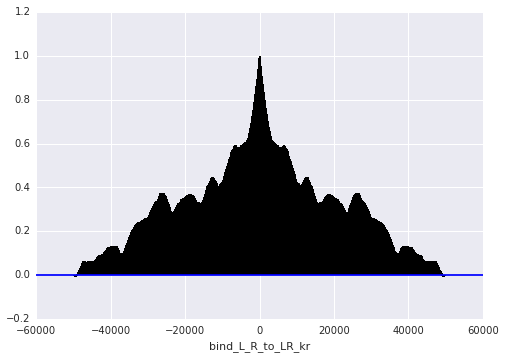

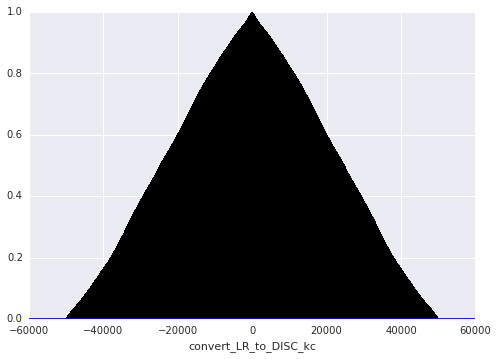

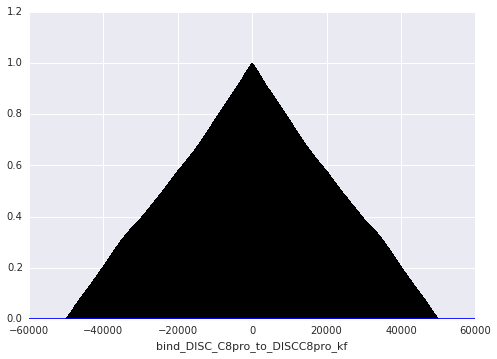

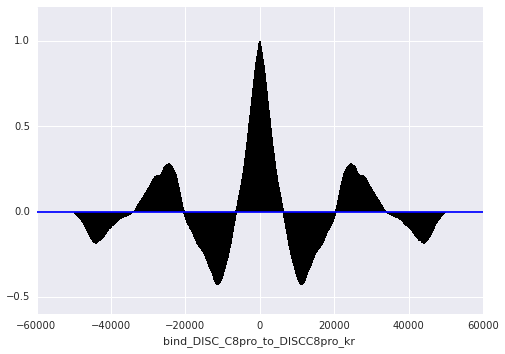

...

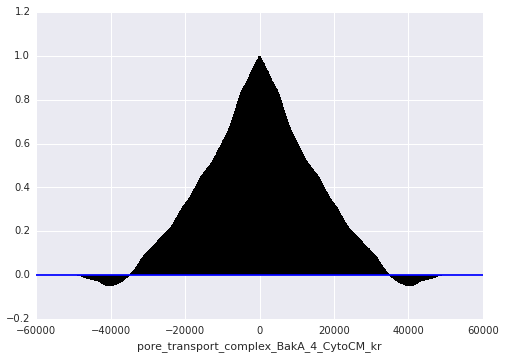

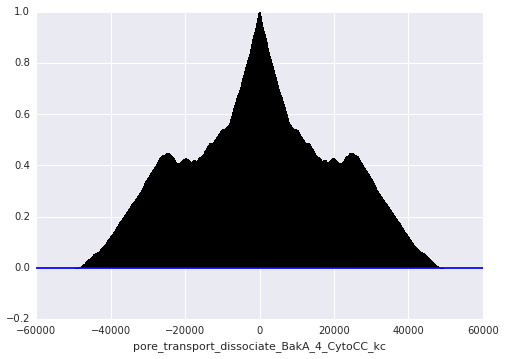

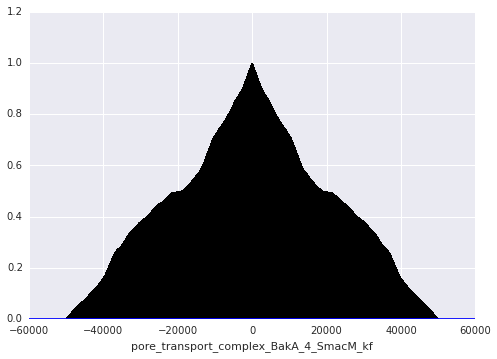

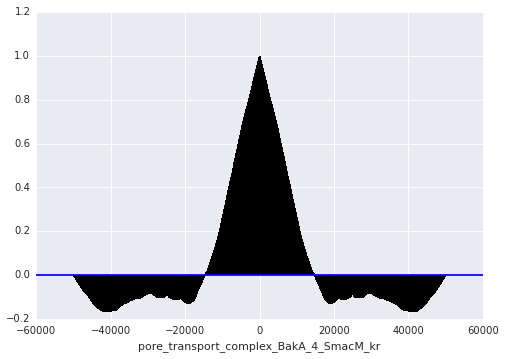

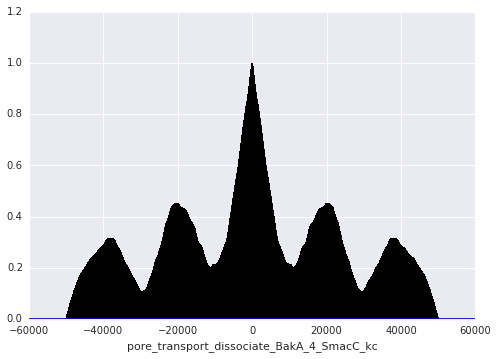

In [23]:
for dim, param_name in enumerate([param.name for param in model.parameters_rules()]):
    fig = plt.figure()
    plt.acorr(traces['a'][2][:,dim], maxlags=None)
    plt.xlabel(str(param_name))

In [ ]:
corner(trace_arr_a[:,50:60:], labels=param_trace_dict_a['param_list'][50:60], bins=10)

In [15]:
acceptance_rates = np.zeros((len(traces['a'][0][0],)))
for dim in range(len(traces['a'][0][0])):
    n_acceptances = 0
    for iteration in range(1, len(traces['a'][0])):
        if traces['a'][0][iteration][dim] != traces['a'][0][iteration-1][dim]:
            n_acceptances += 1
    acceptance_rates[dim] = float(n_acceptances)/len(traces['a'][0])
    print 'N acceptances for parameter: ',str(param_trace_dict_a['param_list'][dim]),' = ',str(n_acceptances),' acceptance rate: ',str(acceptance_rates[dim])
    n_acceptances = 0
acceptance_rates

N acceptances for parameter:  bind_L_R_to_LR_kf  =  852  acceptance rate:  0.01704
N acceptances for parameter:  bind_L_R_to_LR_kr  =  882  acceptance rate:  0.01764
N acceptances for parameter:  convert_LR_to_DISC_kc  =  862  acceptance rate:  0.01724
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kf  =  844  acceptance rate:  0.01688
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kr  =  877  acceptance rate:  0.01754
N acceptances for parameter:  catalyze_DISCC8pro_to_DISC_C8A_kc  =  880  acceptance rate:  0.0176
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kf  =  861  acceptance rate:  0.01722
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kr  =  879  acceptance rate:  0.01758
N acceptances for parameter:  catalyze_C8ABidU_to_C8A_BidT_kc  =  871  acceptance rate:  0.01742
N acceptances for parameter:  bind_DISC_flip_kf  =  869  acceptance rate:  0.01738
N acceptances for parameter:  bind_DISC_flip_kr  =  878  acceptance rate:  0.01756
N acce

array([ 0.01704,  0.01764,  0.01724,  0.01688,  0.01754,  0.0176 ,
        0.01722,  0.01758,  0.01742,  0.01738,  0.01756,  0.01744,
        0.01758,  0.01742,  0.01756,  0.0177 ,  0.01736,  0.01772,
        0.01766,  0.01758,  0.01796,  0.01754,  0.0174 ,  0.0175 ,
        0.01742,  0.0176 ,  0.01762,  0.01768,  0.01756,  0.01616,
        0.01776,  0.01754,  0.01706,  0.0181 ,  0.01736,  0.01754,
        0.01746,  0.01722,  0.01732,  0.01764,  0.01752,  0.01674,
        0.01786,  0.0179 ,  0.01784,  0.01746,  0.01746,  0.0173 ,
        0.01762,  0.01774,  0.01778,  0.01738,  0.01706,  0.01808,
        0.01752,  0.01762,  0.01788,  0.01762,  0.01808,  0.01754,
        0.0176 ,  0.01742,  0.0179 ,  0.01758,  0.0177 ,  0.01754,
        0.01706,  0.01764,  0.01754,  0.01776,  0.0176 ,  0.01738,
        0.01756,  0.01758,  0.01772,  0.01764,  0.0177 ,  0.01788,
        0.0174 ,  0.01754,  0.0177 ,  0.01746,  0.01778,  0.01738,
        0.01776,  0.0172 ,  0.01752,  0.01742])

In [16]:
acceptance_rates = np.zeros((len(traces['a'][1][0],)))
for dim in range(len(traces['a'][1][0])):
    n_acceptances = 0
    for iteration in range(1, len(traces['a'][1])):
        if traces['a'][1][iteration][dim] != traces['a'][1][iteration-1][dim]:
            n_acceptances += 1
    acceptance_rates[dim] = float(n_acceptances)/len(traces['a'][1])
    print 'N acceptances for parameter: ',str(param_trace_dict_a['param_list'][dim]),' = ',str(n_acceptances),' acceptance rate: ',str(acceptance_rates[dim])
    n_acceptances = 0
acceptance_rates

N acceptances for parameter:  bind_L_R_to_LR_kf  =  856  acceptance rate:  0.01712
N acceptances for parameter:  bind_L_R_to_LR_kr  =  857  acceptance rate:  0.01714
N acceptances for parameter:  convert_LR_to_DISC_kc  =  847  acceptance rate:  0.01694
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kf  =  865  acceptance rate:  0.0173
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kr  =  852  acceptance rate:  0.01704
N acceptances for parameter:  catalyze_DISCC8pro_to_DISC_C8A_kc  =  887  acceptance rate:  0.01774
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kf  =  866  acceptance rate:  0.01732
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kr  =  868  acceptance rate:  0.01736
N acceptances for parameter:  catalyze_C8ABidU_to_C8A_BidT_kc  =  880  acceptance rate:  0.0176
N acceptances for parameter:  bind_DISC_flip_kf  =  890  acceptance rate:  0.0178
N acceptances for parameter:  bind_DISC_flip_kr  =  866  acceptance rate:  0.01732
N accept

array([ 0.01712,  0.01714,  0.01694,  0.0173 ,  0.01704,  0.01774,
        0.01732,  0.01736,  0.0176 ,  0.0178 ,  0.01732,  0.01644,
        0.01748,  0.01772,  0.01748,  0.0175 ,  0.01718,  0.01782,
        0.01718,  0.01762,  0.01786,  0.01774,  0.0168 ,  0.01742,
        0.0174 ,  0.01708,  0.0173 ,  0.01782,  0.018  ,  0.01718,
        0.01754,  0.01776,  0.0171 ,  0.01762,  0.01742,  0.01796,
        0.01762,  0.01728,  0.0175 ,  0.01806,  0.01758,  0.0173 ,
        0.01776,  0.01782,  0.0173 ,  0.0178 ,  0.01718,  0.01764,
        0.01736,  0.01804,  0.01766,  0.01772,  0.01698,  0.0175 ,
        0.01724,  0.01758,  0.01778,  0.01754,  0.01726,  0.01722,
        0.01724,  0.01726,  0.01752,  0.0174 ,  0.0171 ,  0.01762,
        0.01742,  0.01776,  0.01736,  0.0174 ,  0.01766,  0.01788,
        0.0178 ,  0.01772,  0.01784,  0.01766,  0.01764,  0.01752,
        0.01708,  0.01764,  0.01756,  0.01778,  0.01778,  0.01744,
        0.01716,  0.01778,  0.01762,  0.01746])

In [17]:
acceptance_rates = np.zeros((len(traces['a'][2][0],)))
for dim in range(len(traces['a'][2][0])):
    n_acceptances = 0
    for iteration in range(1, len(traces['a'][2])):
        if traces['a'][2][iteration][dim] != traces['a'][2][iteration-1][dim]:
            n_acceptances += 1
    acceptance_rates[dim] = float(n_acceptances)/len(traces['a'][2])
    print 'N acceptances for parameter: ',str(param_trace_dict_a['param_list'][dim]),' = ',str(n_acceptances),' acceptance rate: ',str(acceptance_rates[dim])
    n_acceptances = 0
acceptance_rates

N acceptances for parameter:  bind_L_R_to_LR_kf  =  701  acceptance rate:  0.01402
N acceptances for parameter:  bind_L_R_to_LR_kr  =  723  acceptance rate:  0.01446
N acceptances for parameter:  convert_LR_to_DISC_kc  =  699  acceptance rate:  0.01398
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kf  =  681  acceptance rate:  0.01362
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kr  =  683  acceptance rate:  0.01366
N acceptances for parameter:  catalyze_DISCC8pro_to_DISC_C8A_kc  =  706  acceptance rate:  0.01412
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kf  =  689  acceptance rate:  0.01378
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kr  =  715  acceptance rate:  0.0143
N acceptances for parameter:  catalyze_C8ABidU_to_C8A_BidT_kc  =  688  acceptance rate:  0.01376
N acceptances for parameter:  bind_DISC_flip_kf  =  720  acceptance rate:  0.0144
N acceptances for parameter:  bind_DISC_flip_kr  =  722  acceptance rate:  0.01444
N accep

array([ 0.01402,  0.01446,  0.01398,  0.01362,  0.01366,  0.01412,
        0.01378,  0.0143 ,  0.01376,  0.0144 ,  0.01444,  0.01406,
        0.01418,  0.01424,  0.01424,  0.01424,  0.01386,  0.01446,
        0.01438,  0.01484,  0.01396,  0.01412,  0.01412,  0.0141 ,
        0.0146 ,  0.01446,  0.01428,  0.01404,  0.01462,  0.01316,
        0.0141 ,  0.01406,  0.0134 ,  0.01426,  0.01456,  0.01378,
        0.01414,  0.0138 ,  0.01386,  0.01408,  0.01398,  0.0138 ,
        0.01398,  0.01412,  0.0139 ,  0.01428,  0.01416,  0.01398,
        0.01432,  0.0143 ,  0.01408,  0.01426,  0.014  ,  0.01466,
        0.01412,  0.01418,  0.01484,  0.0146 ,  0.01444,  0.01424,
        0.01424,  0.01414,  0.0141 ,  0.01412,  0.0146 ,  0.01424,
        0.01446,  0.01398,  0.01438,  0.01422,  0.01406,  0.0141 ,
        0.01424,  0.01416,  0.01438,  0.01418,  0.01416,  0.01442,
        0.01374,  0.01464,  0.0141 ,  0.01438,  0.0143 ,  0.01416,
        0.01408,  0.01444,  0.01392,  0.01428])

In [18]:
acceptance_rates = np.zeros((len(traces['b'][0][0],)))
for dim in range(len(traces['a'][2][0])):
    n_acceptances = 0
    for iteration in range(1, len(traces['b'][0])):
        if traces['a'][2][iteration][dim] != traces['a'][2][iteration-1][dim]:
            n_acceptances += 1
    acceptance_rates[dim] = float(n_acceptances)/len(traces['b'][0])
    print 'N acceptances for parameter: ',str(param_trace_dict_a['param_list'][dim]),' = ',str(n_acceptances),' acceptance rate: ',str(acceptance_rates[dim])
    n_acceptances = 0
acceptance_rates

N acceptances for parameter:  bind_L_R_to_LR_kf  =  701  acceptance rate:  0.01402
N acceptances for parameter:  bind_L_R_to_LR_kr  =  723  acceptance rate:  0.01446
N acceptances for parameter:  convert_LR_to_DISC_kc  =  699  acceptance rate:  0.01398
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kf  =  681  acceptance rate:  0.01362
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kr  =  683  acceptance rate:  0.01366
N acceptances for parameter:  catalyze_DISCC8pro_to_DISC_C8A_kc  =  706  acceptance rate:  0.01412
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kf  =  689  acceptance rate:  0.01378
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kr  =  715  acceptance rate:  0.0143
N acceptances for parameter:  catalyze_C8ABidU_to_C8A_BidT_kc  =  688  acceptance rate:  0.01376
N acceptances for parameter:  bind_DISC_flip_kf  =  720  acceptance rate:  0.0144
N acceptances for parameter:  bind_DISC_flip_kr  =  722  acceptance rate:  0.01444
N accep

array([ 0.01402,  0.01446,  0.01398,  0.01362,  0.01366,  0.01412,
        0.01378,  0.0143 ,  0.01376,  0.0144 ,  0.01444,  0.01406,
        0.01418,  0.01424,  0.01424,  0.01424,  0.01386,  0.01446,
        0.01438,  0.01484,  0.01396,  0.01412,  0.01412,  0.0141 ,
        0.0146 ,  0.01446,  0.01428,  0.01404,  0.01462,  0.01316,
        0.0141 ,  0.01406,  0.0134 ,  0.01426,  0.01456,  0.01378,
        0.01414,  0.0138 ,  0.01386,  0.01408,  0.01398,  0.0138 ,
        0.01398,  0.01412,  0.0139 ,  0.01428,  0.01416,  0.01398,
        0.01432,  0.0143 ,  0.01408,  0.01426,  0.014  ,  0.01466,
        0.01412,  0.01418,  0.01484,  0.0146 ,  0.01444,  0.01424,
        0.01424,  0.01414,  0.0141 ,  0.01412,  0.0146 ,  0.01424,
        0.01446,  0.01398,  0.01438,  0.01422,  0.01406,  0.0141 ,
        0.01424,  0.01416,  0.01438,  0.01418,  0.01416,  0.01442,
        0.01374,  0.01464,  0.0141 ,  0.01438,  0.0143 ,  0.01416,
        0.01408,  0.01444,  0.01392,  0.01428])